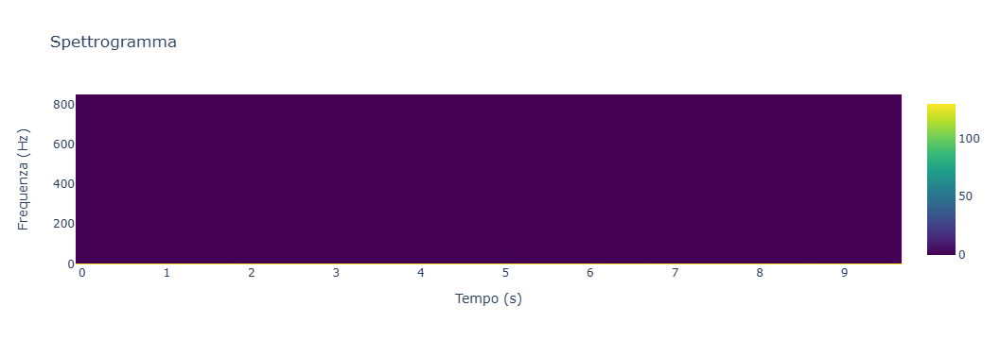

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.fft import fft, fftfreq
import plotly.graph_objects as go

# Apre il file in modalità lettura
file_path = "Desktop/Dati/ProveVere/Sense2GoL Pulse_record_20240409-123815.raw.txt"
with open(file_path, "r") as file:
    # Inizializza una lista vuota per memorizzare i valori dei frame
    frames = []
    # Inizializza una lista vuota per memorizzare i valori di un singolo frame
    frame_values = []
    # Inizializza una variabile contatore per contare il numero di righe lette
    line_count = 0

    # Legge ogni riga del file
    for line in file:
        # Incrementa il contatore di righe
        line_count += 1
        # Ignora le righe di commento e l'intestazione
        if line.startswith('#') or line_count <= 11:
            continue
        # Rimuove eventuali spazi bianchi all'inizio e alla fine della riga
        line = line.strip()
        # Se la riga non è vuota, aggiunge il valore alla lista dei valori del frame corrente
        if line:
            frame_values.append(float(line))
            # Se sono stati letti 512 valori, aggiunge i valori del frame corrente alla lista dei frame
            if len(frame_values) == 1024:
                frames.append(frame_values[:256])  # Considera solo i primi 128 valori di ogni frame
                # Resetta la lista dei valori del frame corrente
                frame_values = []

# Converte la lista dei frame in un array numpy
frames_array = np.array(frames)

# Calcolo della FFT per tutti i frame
spectrogram = np.zeros((256//2, len(frames_array)), dtype=float)

for i, frame in enumerate(frames_array):
    # Calcolo della FFT per il frame corrente
    yf_high = fft(frame[0:256], axis=0)

    # Assegnare solo la parte reale della trasformata
    spectrogram[:, i] = np.abs(yf_high[:256//2])

# Calcolo delle frequenze e del tempo
xf = fftfreq(256, 0.15/256)[:256//2]
t = np.linspace(0, len(frames) * 0.15, len(frames))

# Creazione della heatmap
fig = go.Figure(data=go.Heatmap(
    z=spectrogram,
    x=t,
    y=xf,
    colorscale='Viridis'
))

# Impostazione delle etichette degli assi
fig.update_layout(
    xaxis_title='Tempo (s)',
    yaxis_title='Frequenza (Hz)',
    title='Spettrogramma'
)

# Visualizzazione del plot
fig.show()


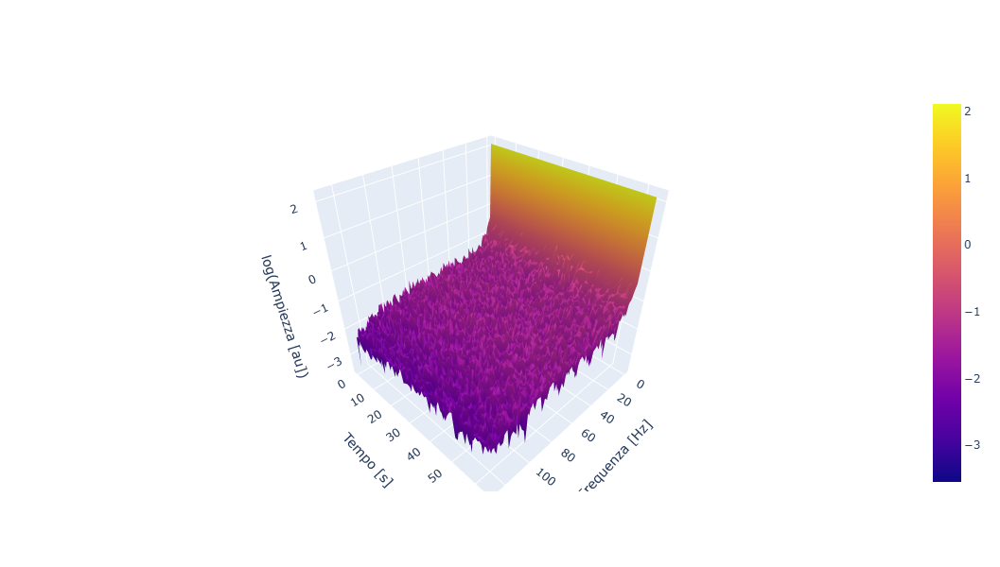

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.fft import fft, fftfreq
import plotly.graph_objects as go

# lettura file
file_path = "Desktop/Dati/ProveVere/Sense2GoL Pulse_record_20240409-123815.raw.txt"
with open(file_path, "r") as file:
    # memorizza i valori dei frame
    frames = []
    # memorizza i valori di un singolo frame
    frame_values = []
    # contatore per il numero di righe lette
    line_count = 0

    # leggo ogni riga del file
    for line in file:
        # incremento il count
        line_count += 1
        # serve per ignorare le righe di commento e l'intestazione
        if line.startswith('#') or line_count <= 11:
            continue
        line = line.strip()
        # if riga non è vuota, aggiungo il valore alla lista dei valori del frame corrente
        if line:
            frame_values.append(float(line))
            # if sono stati letti 512 valori, aggiungo i valori del frame corrente alla lista dei frame
            if len(frame_values) == 1024:
                frames.append(frame_values[:256])  # prendo solo i primi 128 valori di ogni frame
                # resetto la lista dei valori del frame corrente
                frame_values = []

frames_array = np.array(frames)

# fft tutti i frame
spectrogram = np.zeros((len(frames_array), 256//2), dtype=float)

for i, frame in enumerate(frames_array):
    # fft frame corrente
    yf_high = fft(frame[0:256], axis=0)
    spectrogram[i, :] = np.abs(yf_high[:256//2])

T_frame = 1 
tempo_totale = len(frames) * T_frame
xf = fftfreq(256, 1/256)[:256//2]
t = np.linspace(0, tempo_totale, len(frames))

fig = go.Figure(data=[go.Surface(x=xf, y=t, z=spectrogram)])

# definisco etichette grafici e dimensioni finestra di visualizzazione
fig.update_layout(
    scene=dict(
        xaxis_title='Frequenza [Hz]',
        yaxis_title='Tempo [s]',
        zaxis_title='log(Ampiezza [au])'
    ),
    width=800,  # modificare larghezza 
    height=600  # modificare altezza 
)

#asse z in scala logaritmica
fig.update_traces(
    z=np.log10(spectrogram)
)

fig.show()


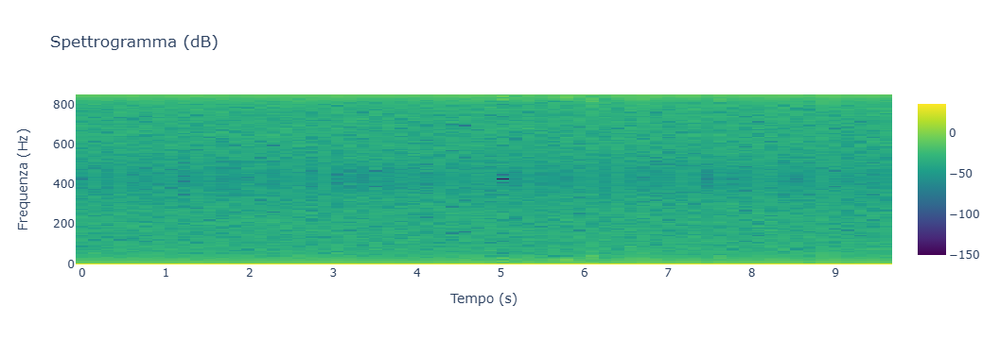

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.fft import fft, fftfreq
import plotly.graph_objects as go

# Apre il file in modalità lettura
file_path = "Desktop/Dati/ProveVere/Sense2GoL Pulse_record_20240409-123815.raw.txt"
with open(file_path, "r") as file:
    # Inizializza una lista vuota per memorizzare i valori dei frame
    frames = []
    # Inizializza una lista vuota per memorizzare i valori di un singolo frame
    frame_values = []
    # Inizializza una variabile contatore per contare il numero di righe lette
    line_count = 0

    # Legge ogni riga del file
    for line in file:
        # Incrementa il contatore di righe
        line_count += 1
        # Ignora le righe di commento e l'intestazione
        if line.startswith('#') or line_count <= 11:
            continue
        # Rimuove eventuali spazi bianchi all'inizio e alla fine della riga
        line = line.strip()
        # Se la riga non è vuota, aggiunge il valore alla lista dei valori del frame corrente
        if line:
            frame_values.append(float(line))
            # Se sono stati letti 512 valori, aggiunge i valori del frame corrente alla lista dei frame
            if len(frame_values) == 1024:
                frames.append(frame_values[:256])  # Considera solo i primi 128 valori di ogni frame
                # Resetta la lista dei valori del frame corrente
                frame_values = []

frames_array = np.array(frames)

# Calcolo della FFT per tutti i frame
spectrogram = np.zeros((256//2, len(frames_array)), dtype=float)

for i, frame in enumerate(frames_array):
    # Calcolo della FFT per il frame corrente
    yf_high = fft(frame[0:256], axis=0)
    spectrogram[:, i] = 20 * np.log10(np.abs(yf_high[:256//2]) + 1e-10)  # aggiungo un piccolo valore costante per evitare log(0)

# Calcolo delle frequenze e del tempo
xf = fftfreq(256, 0.15/256)[:256//2]
t = np.linspace(0, len(frames) * 0.15, len(frames))

# Creazione della heatmap
fig = go.Figure(data=go.Heatmap(
    z=spectrogram,
    x=t,
    y=xf,
    colorscale='Viridis',
    zmin=np.min(spectrogram),  
    zmax=np.max(spectrogram)  
))

#etichette degli assi
fig.update_layout(
    xaxis_title='Tempo (s)',
    yaxis_title='Frequenza (Hz)',
    title='Spettrogramma (dB)'
)

fig.show()


0
65
65


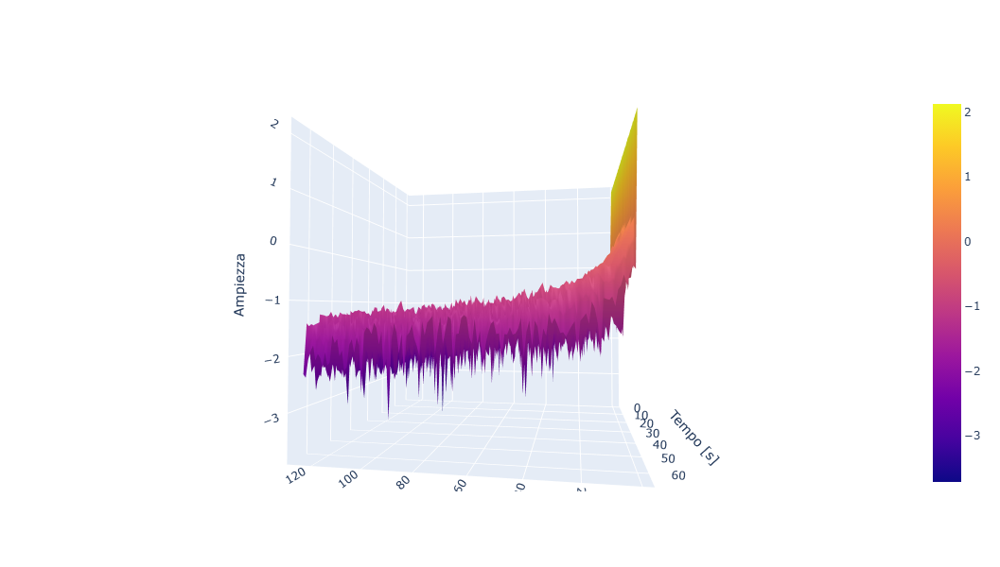

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.fft import fft, fftfreq
import plotly.graph_objects as go
import re 
# lettura file
file_path = "Desktop/Dati/ProveVere/Sense2GoL Pulse_record_20240409-155412.raw.txt"
with open(file_path, "r") as file:
    # memorizza i valori dei frame
    frames = []
    # memorizza i valori di un singolo frame
    frame_values = []
    # contatore per il numero di righe lette
    line_count = 0
    # Salta le prime 12 righe
    for i in range(12):
        file.readline()
    # Leggi la riga 13
    riga_13 = file.readline()
    sample_chirp = int(re.findall(r"\d+", riga_13)[0])
    print(sample_chirp)

    # leggo ogni riga del file
    for line in file:
        # incremento il count
        line_count += 1
        # serve per ignorare le righe di commento e l'intestazione
        if line.startswith('#') or line_count <= 11:
            continue
            
        line = line.strip()
        # if riga non è vuota, aggiungo il valore alla lista dei valori del frame corrente
        if line:
            frame_values.append(float(line))
            # if sono stati letti 512 valori, aggiungo i valori del frame corrente alla lista dei frame
            if len(frame_values) == 1024:
                frames.append(frame_values[:255])  # prendo solo i primi 128 valori di ogni frame
                # resetto la lista dei valori del frame corrente
                frame_values = []

frames_array = np.array(frames)

# fft tutti i frame
spectrogram = np.zeros((len(frames_array), 255//2), dtype=float)

for i, frame in enumerate(frames_array):
    # fft frame corrente
    yf_high = fft(frame[0:255], axis=0)
    spectrogram[i, :] = np.abs(yf_high[:255//2])

T_frame = 1 
tempo_totale = len(frames) * T_frame
print(tempo_totale)
print(len(frames))
xf = fftfreq(256, T_frame/256)[:255//2]
t = np.linspace(0, tempo_totale, len(frames))

fig = go.Figure(data=[go.Surface(x=xf, y=t, z=spectrogram)])

# definisco etichette grafici e dimensioni finestra di visualizzazione
fig.update_layout(
    scene=dict(
        xaxis_title='Frequenza [Hz]',
        yaxis_title='Tempo [s]',
        zaxis_title='Ampiezza'
    ),
    width=800,  # modificare larghezza 
    height=600  # modificare altezza 
)

#asse z in scala logaritmica
fig.update_traces(
    z=np.log10(spectrogram)
)

fig.show()

0


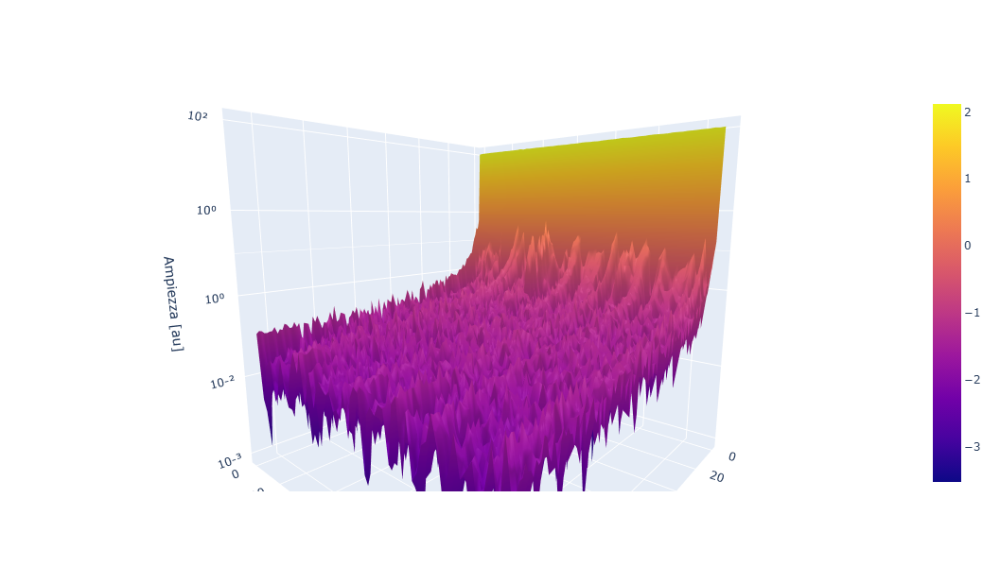

In [15]:
#PROVA GRAFICO CON SCALA LOG SULLA Z
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.fft import fft, fftfreq
import plotly.graph_objects as go
import re 

# Lettura file
file_path = "Desktop/Dati/ProveVere/Sense2GoL Pulse_record_20240530-153142.raw.txt"
with open(file_path, "r") as file:
    # Memorizza i valori dei frame
    frames = []
    frame_values = []
    line_count = 0
    for i in range(12):  # Salta le prime 12 righe
        file.readline()
    riga_13 = file.readline()
    sample_chirp = int(re.findall(r"\d+", riga_13)[0])
    print(sample_chirp)

    for line in file:
        line_count += 1
        if line.startswith('#') or line_count <= 11:  # Ignora commenti e intestazione
            continue
            
        line = line.strip()
        if line:
            frame_values.append(float(line))
            if len(frame_values) == 1024:
                frames.append(frame_values[:255])  # Prende solo i primi 255 valori di ogni frame
                frame_values = []

frames_array = np.array(frames)

# FFT su tutti i frame
spectrogram = np.zeros((len(frames_array), 255//2), dtype=float)

for i, frame in enumerate(frames_array):
    yf_high = fft(frame[0:255], axis=0)
    spectrogram[i, :] = np.abs(yf_high[:255//2])

T_frame = 1 
tempo_totale = len(frames) * T_frame
xf = fftfreq(256, T_frame/256)[:255//2]
t = np.linspace(0, tempo_totale, len(frames))

# Applica la trasformazione logaritmica
spectrogram_log = np.log10(spectrogram + 1e-8)  # Aggiunge un piccolo valore per evitare log(0)

# Genera tickvals e ticktext per l'asse z con apici unicode
tickvals = np.linspace(spectrogram_log.min(), spectrogram_log.max(), num=5)
# Utilizza i caratteri Unicode per i numeri in apice (¹, ², ³, ecc.)
def get_superscript_text(value):
    superscript_map = str.maketrans("0123456789", "⁰¹²³⁴⁵⁶⁷⁸⁹")
    return f"10{str(int(value)).translate(superscript_map)}"

ticktext = [get_superscript_text(np.log10(spectrogram.min() + 1e-8) + (i * (np.log10(spectrogram.max()) - np.log10(spectrogram.min() + 1e-8)) / 4)) for i in range(5)]

fig = go.Figure(data=[go.Surface(x=xf, y=t, z=spectrogram_log)])

# Aggiorna layout e asse z con etichette in potenza di 10 con apici unicode
fig.update_layout(
    scene=dict(
        xaxis_title='Frequenza [Hz]',
        yaxis_title='Tempo [s]',
        zaxis=dict(
            title='Ampiezza [au]',
            tickvals=tickvals,
            ticktext=ticktext,
            nticks=5,
            showticklabels=True
        )
    ),
    width=800,
    height=600
)

# Mostra il grafico
fig.show()
